In [1]:
# %load_ext autoreload
# %autoreload 2

---
### importing librarires
---

In [2]:
import warnings
import numpy as np 
import pandas as pd 
import re

import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px

from functions import (basic_info, preprocess_string, segment, get_top, silhouette_method)
from data_preprocessing import DataPreprocessor
from preprocessor import build_pipeline
from sklearn.preprocessing import StandardScaler
import scipy.cluster.hierarchy as hierarchy
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

warnings.filterwarnings("ignore")

    Business Case
---
**Problem Statement**

Scaler is an online tech-versity offering intensive computer science & Data Science courses through live classes delivered by tech leaders and subject matter experts. The meticulously structured program enhances the skills of software professionals by offering a modern curriculum with exposure to the latest technologies. It is a product by InterviewBit

You are working as a data scientist with the analytics vertical of Scaler, focused on profiling the best companies and job positions to work for from the Scaler database. You are provided with the information for a segment of learners and tasked to cluster them on the basis of their job profile, company, and other features. Ideally, these clusters should have similar characteristics

***Concept Used***

Manual Clustering <br>
Unsupervised Clustering -> K- means, Hierarchical Clustering

---
## data reading and finding out basic info
---

In [3]:
df = pd.read_csv("https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/002/856/original/scaler_clustering.csv")
display(df.head())

,Unnamed: 0,company_hash,email_hash,orgyear,ctc,job_position,ctc_updated_year
0,0,atrgxnnt xzaxv,6de0a4417d18ab14334c3f43397fc13b30c35149d70c05...,2016.0,1100000,Other,2020.0
1,1,qtrxvzwt xzegwgbb rxbxnta,b0aaf1ac138b53cb6e039ba2c3d6604a250d02d5145c10...,2018.0,449999,FullStack Engineer,2019.0
2,2,ojzwnvwnxw vx,4860c670bcd48fb96c02a4b0ae3608ae6fdd98176112e9...,2015.0,2000000,Backend Engineer,2020.0
3,3,ngpgutaxv,effdede7a2e7c2af664c8a31d9346385016128d66bbc58...,2017.0,700000,Backend Engineer,2019.0
4,4,qxen sqghu,6ff54e709262f55cb999a1c1db8436cb2055d8f79ab520...,2017.0,1400000,FullStack Engineer,2019.0


In [4]:
missing_data = basic_info(df)

shape of the date : 
	rows = 205843, columns = 7

missing values: 
	count = 52694


,feature,missing_val_count,missing_val_percentage
5,job_position,52564,25.54
3,orgyear,86,0.04
1,company_hash,44,0.02


duplicated records: 
	count = 0

Unique Values : 


,feature,nunique_vals
0,Unnamed: 0,205843
1,company_hash,37299
2,email_hash,153443
3,orgyear,77
4,ctc,3360
5,job_position,1016
6,ctc_updated_year,7


,fetaure,data type
0,Unnamed: 0,int64
1,company_hash,object
2,email_hash,object
3,orgyear,float64
4,ctc,int64
5,job_position,object
6,ctc_updated_year,float64


In [5]:
display(missing_data)

,feature,missing_val_count,missing_val_percentage
5,job_position,52564,25.54
3,orgyear,86,0.04
1,company_hash,44,0.02


    insights
---
- There are a total of 7 features and 205843 records

    1. ***Unnamed: 0*** : nothing but an index
    2. ***company_hash*** : the company he's working with (current employeer of the learner)
    3. ***email_hash*** : personal identiiable information
    4. ***orgyear*** : employment start date 
    5. ***ctc*** : current CTC
    6. ***job_position*** : job role in the comapny
    7. ***ctc_updated_year*** : Year in which CTC got updated (Yearly increments, Promotions)

- We can drop ***Unnamed: 0***, as it does not add any value
- there are some missing values present in ***job_position***, ***orgyear***, ***company_hash***
    - the missing values for *orgyear* and *company_hash* are very less (we can simply remove them, let's do the imputation later)
    - *job_position* have a lot of missing_values (should be imputed properly)
- there are no duplicated records

- we can see that the total emails present are less than that of available records,
    - the emails are repeated (should check the reason behind)

- there are some features of object data type, which are needed to be taken care (some encoding should be done)
- and for the numerical features the outlier should be taken care

In [6]:
display(df.describe())

,Unnamed: 0,orgyear,ctc,ctc_updated_year
count,205843.000000,205757.000000,2.058430e+05,205843.000000
mean,103273.941786,2014.882750,2.271685e+06,2019.628231
std,59741.306484,63.571115,1.180091e+07,1.325104
min,0.000000,0.000000,2.000000e+00,2015.000000
25%,51518.500000,2013.000000,5.300000e+05,2019.000000
50%,103151.000000,2016.000000,9.500000e+05,2020.000000
75%,154992.500000,2018.000000,1.700000e+06,2021.000000
max,206922.000000,20165.000000,1.000150e+09,2021.000000


- the max year for the orgyear is 20165, there is definitely something wrong here
- we can remove the data which has orgyear > 2024 or just replace with 2024 or we can try find any relation for those errors
    - and the minimum year of orgyear is also 0, need to be taken care

- the minimum of ctc is 2, which looks strange
- and the maximum is 1000150000 (there might be some skew in the data)

In [7]:
cat_cols = [col for col in df.columns if df[col].dtype == "O"]
num_cols = [col for col in df.columns if df[col].dtype != "O"]

print(f"categorical cols = {cat_cols}")
print(f"numerical cols = {num_cols}")

categorical cols = ['company_hash', 'email_hash', 'job_position']
numerical cols = ['Unnamed: 0', 'orgyear', 'ctc', 'ctc_updated_year']


---
## EDA
---

### Univariate Analysis
---

The feature CTC : 
----------------------------------------------------------------------------------------------------
   minimum value = 2
   maximum value = 1000150000
   95th percentile = 3800000.0
   5th percentile = 200000.0
   mean = 2271685.0419931696
   meadian = 950000.0
----------------------------------------------------------------------------------------------------


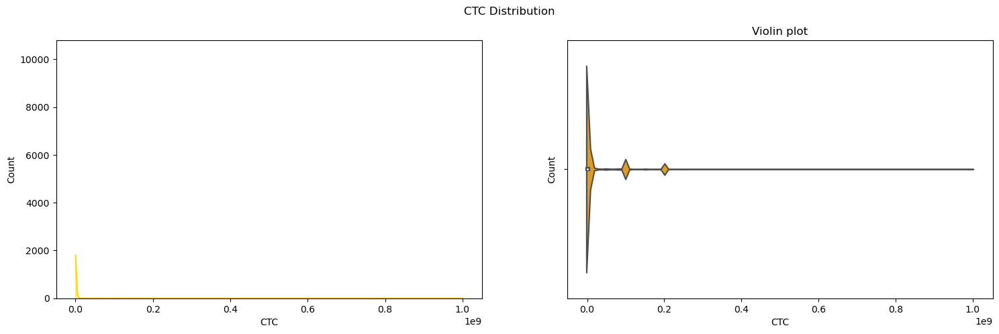

In [8]:
# Freedman-Diaconis Rule: 
# This rule takes into account the interquartile range (IQR) of the data
# It's generally considered more robust, especially for datasets with outliers

q75, q25, q95 = np.percentile(df.ctc, [75 ,25, 95])
iqr = q75 - q25
bin_width = 2 * iqr / (len(df.ctc) ** (1/3))
num_bins = int((max(df.ctc) - min(df.ctc)) / bin_width)

print(f"The feature CTC : \n{'-' * 100}\n   minimum value = {df.ctc.min()}\n   maximum value = {df.ctc.max()}")
print(f"   95th percentile = {q95}\n   5th percentile = {np.percentile(df.ctc, 5)}")
print(f"   mean = {df.ctc.mean()}\n   meadian = {df.ctc.median()}")
print("-" * 100)

fig, ax = plt.subplots(1, 2, figsize=(18, 5))

# Plot histogram with KDE
sns.histplot(df.ctc, ax=ax[0], kde=True, bins=num_bins, color = "Gold")
ax[0].set_xlabel("CTC")
ax[1].set_title("hist plot")


# Plot histogram with KDE and zoomed in
sns.violinplot(data = df, x = "ctc", ax=ax[1], color = "Orange")
ax[1].set_xlabel("CTC")
ax[1].set_ylabel("Count")
ax[1].set_title("Violin plot")

plt.suptitle("CTC Distribution")
plt.show()

    insights
---
- the min value is 2, which seems strange (but we can replace ctc < 5th percentile value with 5th percentile value)
- max value is very high when compared to 95th percentile, 
    - it is possible for peers with high salray to join Scaler, so should be taken care
- right skewed data (transformation are needed to be done)
- the mean is dragged towrards right from median
- it seems like there are 3 clusters in CTC

The feature CTC : 
----------------------------------------------------------------------------------------------------
   minimum value = 0.0
   maximum value = 20165.0
   95th percentile = 2020.0
   5th percentile = 2007.0
   mean = 2014.8827500400957
   meadian = 2016.0
----------------------------------------------------------------------------------------------------


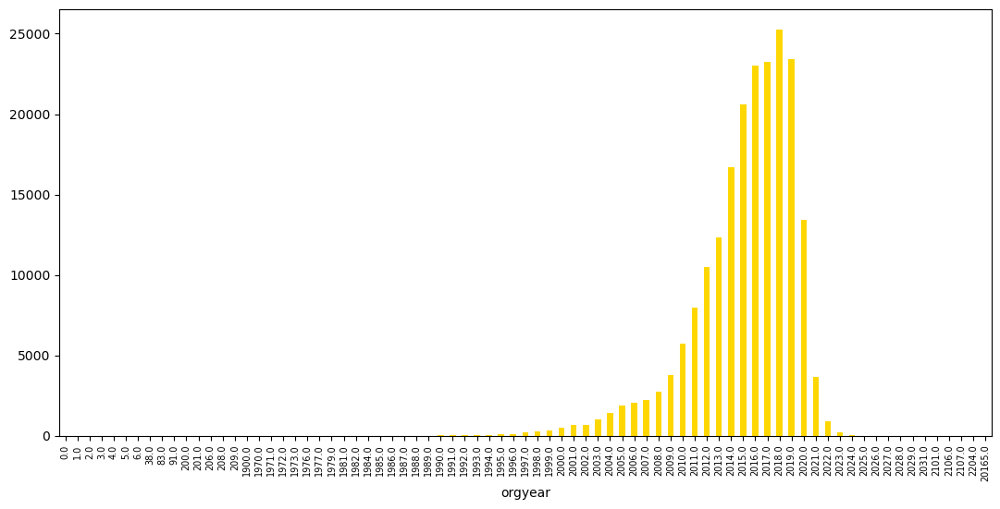

In [9]:
arr_cleaned = df[~np.isnan(df.orgyear)]["orgyear"]

print(f"The feature CTC : \n{'-' * 100}\n   minimum value = {df.orgyear.min()}\n   maximum value = {df.orgyear.max()}")
print(f"   95th percentile = {np.percentile(arr_cleaned, 95, interpolation='nearest')}\n   5th percentile = {np.percentile(arr_cleaned, 5, interpolation='nearest')}")
print(f"   mean = {df.orgyear.mean()}\n   meadian = {df.orgyear.median()}")
print("-" * 100)

plt.figure(figsize=(13, 6))
df.orgyear.value_counts().sort_index().plot(kind = "bar", color = "Gold")
plt.tick_params(axis = 'x', labelsize = 7)

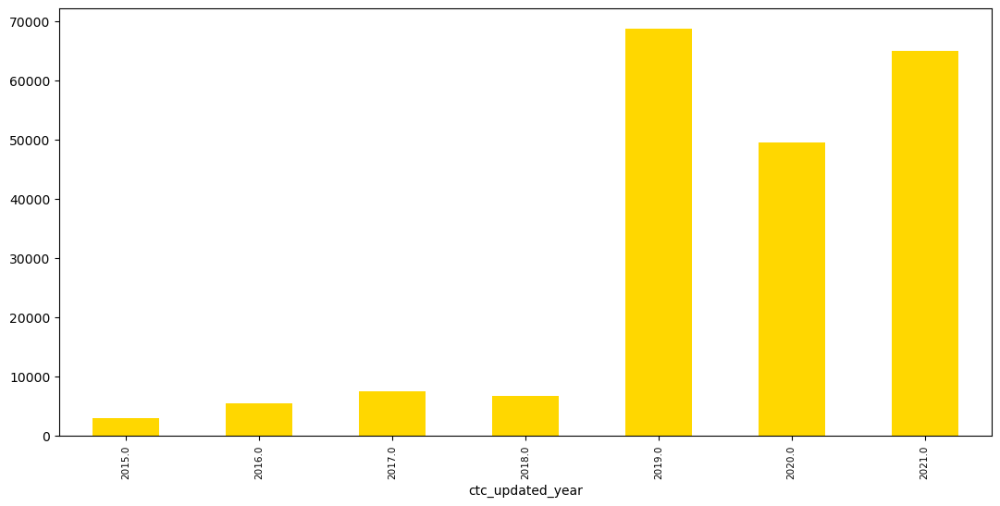

In [10]:
plt.figure(figsize=(13, 6))
df.ctc_updated_year.value_counts().sort_index().plot(kind = "bar", color = "gold")
plt.tick_params(axis = 'x', labelsize = 7.5)

    insights
---
- we can see that minimum orgyear is 0, which is quite impossible 
    - the average age of human in 76 years, and they start age for working might be 21 
    - so people might for 35 years (atmost), which suggests minimum for orgyear to be 1988
    - but scaler is a upskilling platform, people with higher age might not be keen to upskill
    - we can clip the values with 1988 or we can use IQR method or we can use some anomalies detection methods

-  the orgyear's are > 2023, which is odd and not possible (there might be some error)
    - we can clip those values with 2023 or 
    - we can check with ctc_updated_year and handle those values respectively
- we can create a feature which tells us about duration present between hike increament

In [11]:
# fristly let's check if there is any data where ctc_updated_year is greater than orgyear

df[(df.orgyear > df.ctc_updated_year)]

,Unnamed: 0,company_hash,email_hash,orgyear,ctc,job_position,ctc_updated_year
8,8,utqoxontzn ojontbo,e245da546bf50eba09cb7c9976926bd56557d1ac9a17fb...,2020.0,450000,NaN,2019.0
17,17,puxn,26b502eb6439ac80bd618a6f7c2b1c640b84c1e64c472c...,2020.0,1400000,NaN,2019.0
40,40,rvqotz nghmqg,96b1eb6b3ba24764239d502e3e5d9353af9dbd20594534...,2021.0,2500000,Other,2020.0
48,48,rgfto wgbuvzxto xzw,7ce201f4f032c2af65b5d11f549de91ea3e62920834e72...,2020.0,3010000,NaN,2019.0
56,56,axztqg xzzgcvnxgz ucn rna,3a8a6f0924d0d337eb63d8f6c6b6a3608913b7e4c95353...,2020.0,700000,Frontend Engineer,2019.0
...,...,...,...,...,...,...,...
205796,206876,zgn vuurxwvmrt,e5ef043e885543843a2ffc11e18ba1662194512592b442...,2021.0,19800000,NaN,2019.0
205798,206878,ztw wgqugqvnxgz,7538a084adebf36d36fd425c362fdc1ae0409e7623ad08...,2020.0,800000,NaN,2019.0
205801,206881,zgn vuurxwvmrt,03dea5143d030be1e5040ac960f2eeb4f42e2f4882d182...,2019.0,1800000,NaN,2016.0
205804,206884,myvqvn trtwnqgzxwo rxbxnta,f0545c8d78cb9f797462e4e4d8da76f01ca38b41be3388...,2022.0,1000000,NaN,2020.0


      there are 8847 rows, maybe the person might have changed the job and given the details of the hike for previous comapny
---
this completely comes from business
and I am assuming in such way and creating an another feature emp_change, 
- emp_change = 1 if orgyear > ctc_updated_year
- emp_change = 0 else

In [12]:
df[(df.orgyear > 2023)]

# there are 86 rows and some contains records with orgyear > ctc_updated_year
# it might be enough to clip those values to 2023 

,Unnamed: 0,company_hash,email_hash,orgyear,ctc,job_position,ctc_updated_year
2211,2211,phrxkv,3394674bb6bb1de6289e931853fa0bd131c811e0054a92...,2031.0,1500000,Backend Engineer,2020.0
2415,2415,xb v onhatzn,ef3565a969075def44d98b6df51f8bbfb42248d0008514...,2024.0,110000,Frontend Engineer,2021.0
3113,3113,onhatzn vn bzzxn vrrvyvmva,c723c1d7ec4d808af6f77d58594e36884340cb803389d6...,2024.0,1200000,Other,2021.0
3651,3651,wgszxkvzn,2cc6bae4e52677d27ce3fca38d7a01ecbe537e1dc1c48d...,2106.0,600000,NaN,2021.0
3893,3893,qtbgnt vzvrjnxwo lgmo,1439cc5e284ee01eaacb919569f4198f8b569612ac5134...,2024.0,1400000,FullStack Engineer,2019.0
...,...,...,...,...,...,...,...
191308,192267,cggbofvj,3d96a8c43234f0bfa905b7c4941fe74a4e5e9b6d761f64...,2024.0,60000,Frontend Engineer,2021.0
191361,192321,zvz,207390e4bc6a321ada3bc951a9a5391ff54232e48dacc6...,2024.0,1400000,Engineering Leadership,2021.0
198187,199212,xb v onhatzn,9429a19771ae913f169917d380c94f003115aaaf904388...,2025.0,300000,Other,2021.0
202210,203276,mqvmtzatq,d66f939c4318c1958be5bc9e7b70b741aa61be7493ff58...,2028.0,1300000,Backend Engineer,2021.0


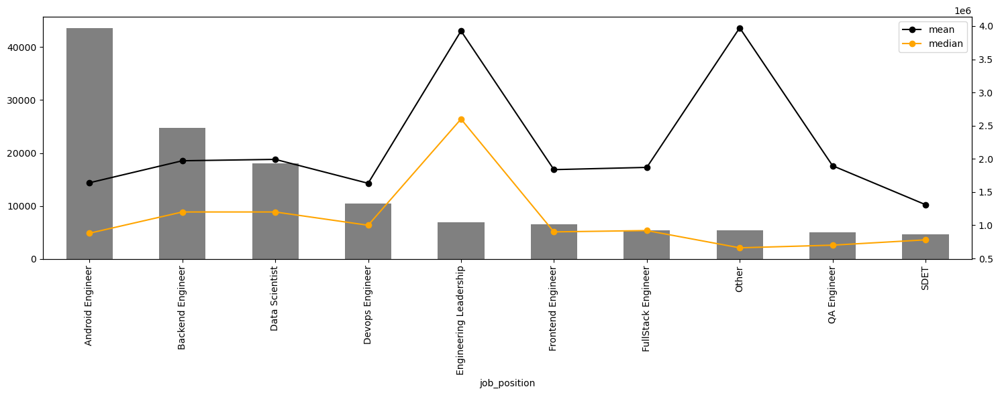

Missing values in job position = 52564


In [13]:
# Create a figure and axis for the line plot
fig, ax1 = plt.subplots(figsize=(15, 6))

# Plot the bar plot
df.job_position.value_counts()[:10].plot(kind="bar", ax=ax1, color="grey")
ax1.tick_params(axis='y', labelcolor='black')

# Create a secondary y-axis for the bar plot
ax2 = ax1.twinx()

# Plot the line plot
df[df.job_position.isin(df.job_position.value_counts()[:10].index)].groupby(by="job_position")["ctc"].agg(["mean", "median"]).plot(kind="line", ax=ax2, color=["black", "orange"], marker='o', linestyle='-')
# ax2.tick_params(axis='x', labelsize=7.5)

# Show the plot
plt.tight_layout() 
plt.show()

# Print missing values
print("Missing values in job position =", df.job_position.isna().sum())


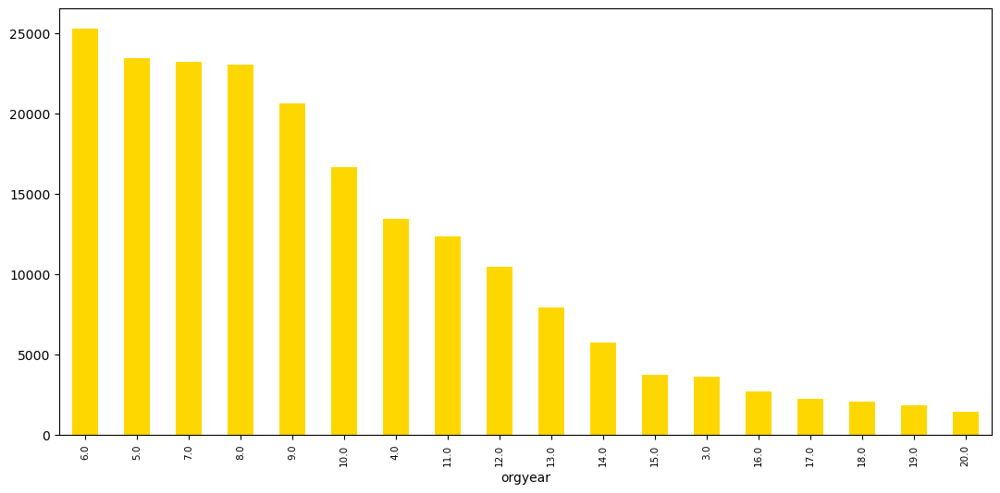

In [14]:
yoe = 2024 - df.orgyear
yoe = yoe.apply(lambda x : x if x > 0 else 0)

plt.figure(figsize=(13, 6))
yoe.value_counts()[:20].plot(kind = "bar", color = "gold")
plt.tick_params(axis = 'x', labelsize = 7.5)

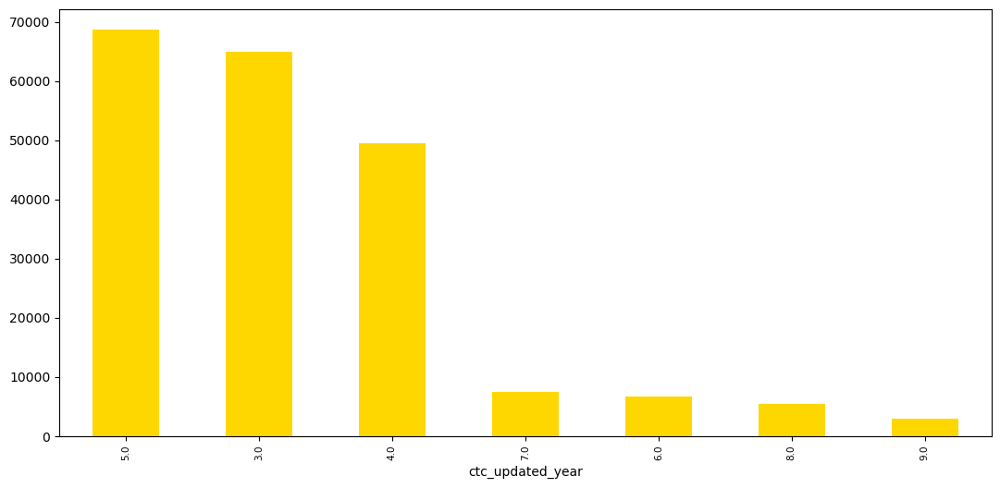

In [15]:
ctc_updated_year = 2024 - df.ctc_updated_year
ctc_updated_year = ctc_updated_year.apply(lambda x : x if x > 0 else 0)

plt.figure(figsize=(13, 6))
ctc_updated_year.value_counts().plot(kind = "bar", color = "gold")
plt.tick_params(axis = 'x', labelsize = 7.5)

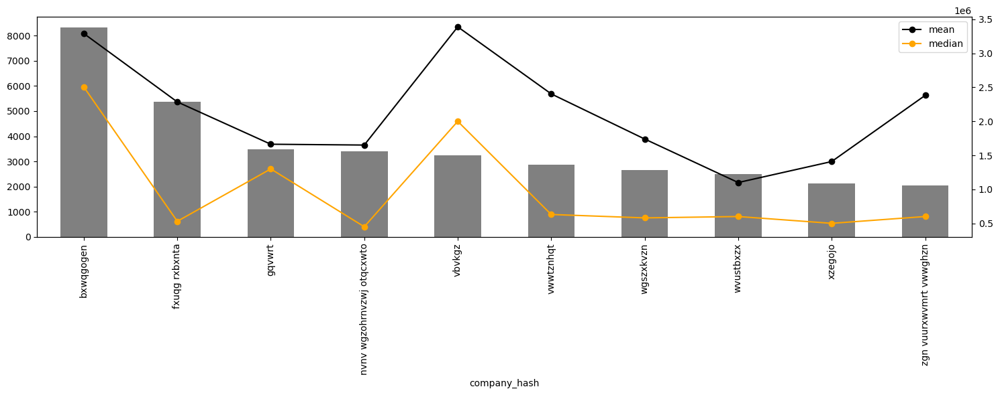

Missing values in job position = 44


In [16]:
import matplotlib.pyplot as plt

# Create a figure and axis for the line plot
fig, ax1 = plt.subplots(figsize=(15, 6))

# Plot the bar plot
df.company_hash.value_counts()[:10].plot(kind="bar", ax=ax1, color="grey")
ax1.tick_params(axis='y', labelcolor='black')

# Create a secondary y-axis for the bar plot
ax2 = ax1.twinx()

# Plot the line plot
df[df.company_hash.isin(df.company_hash.value_counts()[:10].index)].groupby(by="company_hash")["ctc"].agg(["mean", "median"]).plot(kind="line", ax=ax2, color=["black", "orange"], marker='o', linestyle='-')
ax2.tick_params(axis='x', labelsize=7.5)

# Show the plot
plt.tight_layout() 
plt.show()

# Print missing values
print("Missing values in job position =", df.company_hash.isna().sum())


In [17]:
filtered_df = df[(df.company_hash.isin(df.company_hash.value_counts()[:10].index))]

grouped_data = filtered_df.groupby(by=["company_hash", "job_position"])["job_position"].agg("count").unstack()
top_10_jobs = grouped_data.apply(lambda x: x.nlargest(10).index.tolist(), axis=1)
top_10_jobs = top_10_jobs.to_dict()

### Bivariate Analysis
---

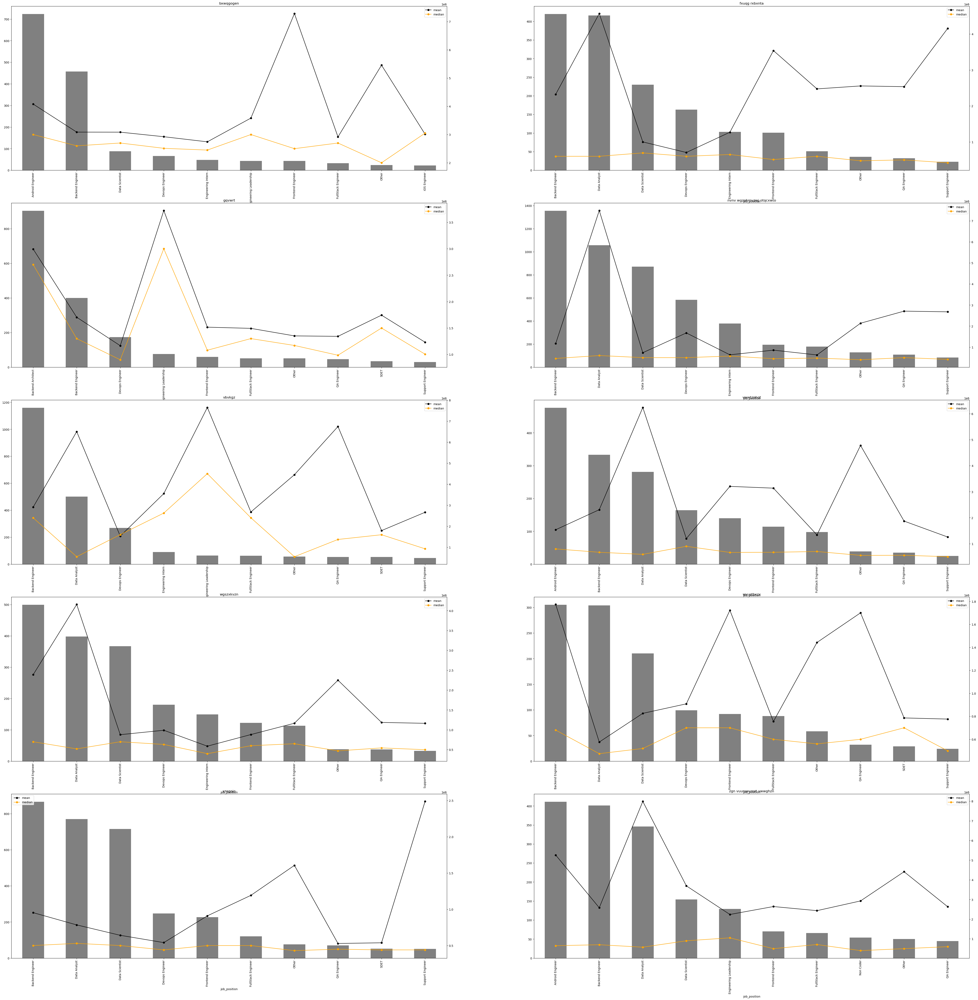

In [18]:
fig, ax = plt.subplots(5, 2, figsize=(60, 60))
row, col = 0, 0

for company in top_10_jobs.keys():
    plot_data = df[(df.company_hash == company) & (df.job_position.isin(top_10_jobs[company]))]
    
    plot_data.job_position.value_counts().plot(kind="bar", ax=ax[row][col], color="grey")
    ax[row][col].tick_params(axis='y', labelcolor='black')

    # Create a secondary y-axis for the bar plot
    ax2 = ax[row][col].twinx()

    # Plot the line plot
    plot_data.groupby(by="job_position")["ctc"].agg(["mean", "median"]).plot(kind="line", ax=ax2, color=["black", "orange"], marker='o', linestyle='-')
    ax2.tick_params(axis='x', labelsize=7.5)
    ax[row][col].set_title(company)
    col += 1
    if col % 2 == 0:
        row += 1
        col = 0
    

In [19]:
df.head()

,Unnamed: 0,company_hash,email_hash,orgyear,ctc,job_position,ctc_updated_year
0,0,atrgxnnt xzaxv,6de0a4417d18ab14334c3f43397fc13b30c35149d70c05...,2016.0,1100000,Other,2020.0
1,1,qtrxvzwt xzegwgbb rxbxnta,b0aaf1ac138b53cb6e039ba2c3d6604a250d02d5145c10...,2018.0,449999,FullStack Engineer,2019.0
2,2,ojzwnvwnxw vx,4860c670bcd48fb96c02a4b0ae3608ae6fdd98176112e9...,2015.0,2000000,Backend Engineer,2020.0
3,3,ngpgutaxv,effdede7a2e7c2af664c8a31d9346385016128d66bbc58...,2017.0,700000,Backend Engineer,2019.0
4,4,qxen sqghu,6ff54e709262f55cb999a1c1db8436cb2055d8f79ab520...,2017.0,1400000,FullStack Engineer,2019.0


---
## PreProcessing
---

In [20]:
print("shape before preprocessing = {}".format(df.shape))

shape before preprocessing = (205843, 7)


In [21]:
df.drop(["Unnamed: 0", "email_hash"], axis = 1, inplace = True)
print("shape = {}".format(df.shape))

shape = (205843, 5)


In [22]:
n = df.job_position.nunique()
print("number of unique job positions before preprocessing = {}".format(n))
df.job_position=df.job_position.apply(lambda x: preprocess_string(str(x)))
n = df.job_position.nunique()
print("number of unique job positions before preprocessing = {}".format(n))

number of unique job positions before preprocessing = 1016
number of unique job positions before preprocessing = 856


In [23]:
n = df.company_hash.nunique()
print("number of unique job positions before preprocessing = {}".format(n))
df.company_hash = df.company_hash.apply(lambda x: preprocess_string(str(x)))
n = df.company_hash.nunique()
print("number of unique job positions before preprocessing = {}".format(n))

number of unique job positions before preprocessing = 37299
number of unique job positions before preprocessing = 37208


In [24]:
df=df[~((df['company_hash']=='') | (df['job_position']==''))]
print("shape = {}".format(df.shape))

shape = (205745, 5)


In [25]:
print("number of duplicated records = {}".format(df.duplicated().sum()))
df.drop_duplicates(keep = "first", inplace = True)
print("shape = {}".format(df.shape))

number of duplicated records = 17593
shape = (188152, 5)


In [26]:
df.loc[df['job_position']=='nan', 'job_position']=np.nan
df.loc[df['company_hash']=='nan', 'job_position']=np.nan

In [27]:
job_counts = df.job_position.value_counts().reset_index()
filtered_jobs = job_counts[job_counts['job_position'].str.contains('other|others', case=False, na=False)]
print(filtered_jobs)
print(df.job_position.isna().sum())

    job_position  count
2          other  16167
534       others      1
43492


In [28]:
df.loc[df.groupby("company_hash")["ctc"].transform("count") < 5, "company_hash"] = "Others"

In [29]:
pipeline = DataPreprocessor(df = df)
X = pipeline.transform(c_encoding = False)

shape before pipeline = (188152, 5)


missing values 86 are filled in orgyear, and outlirs are clipped
missing values 0 are filled in ctc, and outlirs are clipped
missing values 43492 are filled in job_position to 'Unknown', and shape = (188152, 5)
'hike_in_current_org', feature is created
missing values 0 are filled in company_hash to 'Unknown', and shape = (188152, 6)
any duplicates present? True, 21293
duplicates values are dropped, and shape = (166859, 6)
shape after pipeline = (166859, 6)


In [30]:
X["yoe_in_current_organization"] = X.orgyear.max() - X.orgyear
X["yoe_in_current_organization"] = X["yoe_in_current_organization"].apply(lambda x : x if x > 0 else 0)

In [31]:
X.head()

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization
0,atrgxnnt xzaxv,2016.0,1100000,other,2020.0,1,5.0
1,qtrxvzwt xzegwgbb rxbxnta,2018.0,449999,fullstack engineer,2019.0,1,3.0
2,Others,2015.0,2000000,backend engineer,2020.0,1,6.0
3,ngpgutaxv,2017.0,700000,backend engineer,2019.0,1,4.0
4,qxen sqghu,2017.0,1400000,fullstack engineer,2019.0,1,4.0


In [32]:
X.isna().sum()

company_hash                   0
orgyear                        0
ctc                            0
job_position                   0
ctc_updated_year               0
hike_in_current_org            0
yoe_in_current_organization    0
dtype: int64

In [33]:
X.describe(include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
company_hash,166859,3760,Others,26788,NaN,NaN,NaN,NaN,NaN,NaN,NaN
orgyear,166859.0,NaN,NaN,NaN,2014.818161,4.194021,2000.0,2013.0,2016.0,2018.0,2021.0
ctc,166859.0,NaN,NaN,NaN,1537924.35343,1841308.30048,30000.0,600000.0,1030000.0,1800000.0,15000000.0
job_position,166859,855,Unknown,37275,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ctc_updated_year,166859.0,NaN,NaN,NaN,2019.533037,1.375625,2015.0,2019.0,2020.0,2021.0,2021.0
hike_in_current_org,166859.0,NaN,NaN,NaN,0.891921,0.310481,0.0,1.0,1.0,1.0,1.0
yoe_in_current_organization,166859.0,NaN,NaN,NaN,6.181839,4.194021,0.0,3.0,5.0,8.0,21.0


<Axes: xlabel='ctc', ylabel='yoe_in_current_organization'>

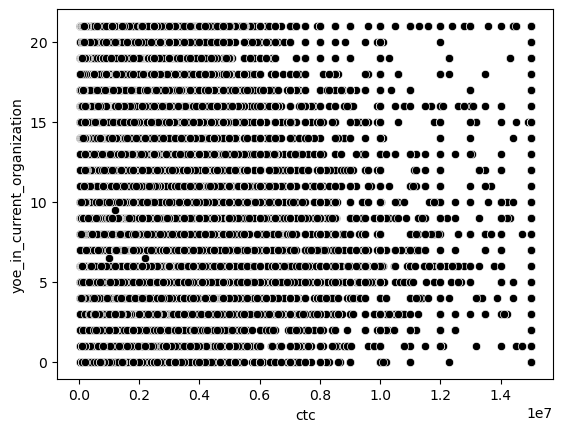

In [34]:
sns.scatterplot(x = X["ctc"], y = X["yoe_in_current_organization"], color = "black")

---
## Manual Clustering 
---

#### Based on the features present (ctc, job_position, yoe) 
    Designation
---

In [35]:
group_yjc = X.groupby(by = ["yoe_in_current_organization", "job_position", "company_hash"])["ctc"].describe()
display(group_yjc)

count  \
yoe_in_current_organization job_position              company_hash                           
0.0                         Unknown                   Others                         130.0   
                                                      a ntwyzgrgsxto                   1.0   
                                                      adw ntwyzgrgsj                   2.0   
                                                      agzn fgqp xz vzj gqsvzxkvnxgz    1.0   
                                                      athnowyt ntrtpgb                 1.0   
...                                                                                    ...   
21.0                        team manager              nvnv wgzohrnvzwj otqcxwto        1.0   
                            technical consulting      ytfrtnn uvwpvqa tzntquqxot       1.0   
                            technical program program vwr axsxnvr                      1.0   
                            technology architect      vwwtznhqt                        1.0   
                            trainer                   Others                           1.0   

                                                                                             mean  \
yoe_in_current_organization job_position              company_hash                                  
0.0                         Unknown                   Others                         1.701074e+06   
                                                      a ntwyzgrgsxto                 3.500000e+05   
                                                      adw ntwyzgrgsj                 2.200000e+05   
                                                      agzn fgqp xz vzj gqsvzxkvnxgz  1.600000e+06   
                                                      athnowyt ntrtpgb               2.800000e+06   
...                                                                                           ...   
21.0                        team manager              nvnv wgzohrnvzwj otqcxwto      9.500000e+05   
                            technical consulting      ytfrtnn uvwpvqa tzntquqxot     2.500000e+06   
                            technical program program vwr axsxnvr                    2.300000e+06   
                            technology architect      vwwtznhqt                      4.200000e+06   
                            trainer                   Others                         4.000000e+05   

                                                                                              std  \
yoe_in_current_organization job_position              company_hash                                  
0.0                         Unknown                   Others                         2.706020e+06   
                                                      a ntwyzgrgsxto                          NaN   
                                                      adw ntwyzgrgsj                 1.979899e+05   
                                                      agzn fgqp xz vzj gqsvzxkvnxgz           NaN   
                                                      athnowyt ntrtpgb                        NaN   
...                                                                                           ...   
21.0                        team manager              nvnv wgzohrnvzwj otqcxwto               NaN   
                            technical consulting      ytfrtnn uvwpvqa tzntquqxot              NaN   
                            technical program program vwr axsxnvr                             NaN   
                            technology architect      vwwtznhqt                               NaN   
                            trainer                   Others                                  NaN   

                                                                                           min  \
yoe_in_current_organization job_position              company_hash                               
0.0                         Unknown   

In [36]:
df_yjc = X.merge(group_yjc, on = ["yoe_in_current_organization", "job_position", "company_hash"], how = "left")
df_yjc.head()

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max
0,atrgxnnt xzaxv,2016.0,1100000,other,2020.0,1,5.0,1.0,1.100000e+06,NaN,1100000.0,1100000.0,1100000.0,1100000.00,1100000.0
1,qtrxvzwt xzegwgbb rxbxnta,2018.0,449999,fullstack engineer,2019.0,1,3.0,7.0,7.742856e+05,2.509223e+05,449999.0,610000.0,750000.0,900000.00,1200000.0
2,Others,2015.0,2000000,backend engineer,2020.0,1,6.0,448.0,1.365031e+06,1.859983e+06,30000.0,371250.0,894500.0,1624999.75,15000000.0
3,ngpgutaxv,2017.0,700000,backend engineer,2019.0,1,4.0,7.0,1.158571e+06,4.047810e+05,700000.0,825000.0,1200000.0,1405000.00,1750000.0
4,qxen sqghu,2017.0,1400000,fullstack engineer,2019.0,1,4.0,1.0,1.400000e+06,NaN,1400000.0,1400000.0,1400000.0,1400000.00,1400000.0


In [37]:
df_yjc["designation"] = df_yjc.apply(lambda x: segment(x['ctc'],x['50%'],x['75%']),axis=1)
display(df_yjc.head(2))
display(df_yjc.designation.value_counts().reset_index())

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,designation
0,atrgxnnt xzaxv,2016.0,1100000,other,2020.0,1,5.0,1.0,1.100000e+06,NaN,1100000.0,1100000.0,1100000.0,1100000.0,1100000.0,2
1,qtrxvzwt xzegwgbb rxbxnta,2018.0,449999,fullstack engineer,2019.0,1,3.0,7.0,7.742856e+05,250922.32435,449999.0,610000.0,750000.0,900000.0,1200000.0,3


,designation,count
0,2,75573
1,3,55724
2,1,35562


#### Manual Clustering based on company and job position 
    class
---

In [38]:
group_jc = X.groupby(by = ["job_position", "company_hash"])["ctc"].describe()
display(group_jc)

count  \
job_position          company_hash                                       
Unknown               Others                                    3525.0   
                      a ntwyzgrgsxto                               6.0   
                      aaqxctz avnv owxtzwto  vzvrjnxwo ucn rna     1.0   
                      abwavnv ojontb                               1.0   
                      adw ntwyzgrgsj                              69.0   
...                                                                ...   
wordpress developer   Others                                       1.0   
worker                zgn vuurxwvmrt vwwghzn                       1.0   
x                     Others                                       1.0   
young professional ii sgctqzbtzn ge xzaxv                          1.0   
zomato                kgbvng                                       2.0   

                                                                        mean  \
job_position          company_hash                                             
Unknown               Others                                    1.484681e+06   
                      a ntwyzgrgsxto                            1.229167e+06   
                      aaqxctz avnv owxtzwto  vzvrjnxwo ucn rna  5.000000e+05   
                      abwavnv ojontb                            7.000000e+05   
                      adw ntwyzgrgsj                            8.502319e+05   
...                                                                      ...   
wordpress developer   Others                                    6.000000e+05   
worker                zgn vuurxwvmrt vwwghzn                    2.000000e+05   
x                     Others                                    4.000000e+05   
young professional ii sgctqzbtzn ge xzaxv                       5.000000e+05   
zomato                kgbvng                                    3.000000e+05   

                                                                         std  \
job_position          company_hash                                             
Unknown               Others                                    1.962596e+06   
                      a ntwyzgrgsxto                            1.401465e+06   
                      aaqxctz avnv owxtzwto  vzvrjnxwo ucn rna           NaN   
                      abwavnv ojontb                                     NaN   
                      adw ntwyzgrgsj                            1.036041e+06   
...                                                                      ...   
wordpress developer   Others                                             NaN   
worker                zgn vuurxwvmrt vwwghzn                             NaN   
x                     Others                                             NaN   
young professional ii sgctqzbtzn ge xzaxv                                NaN   
zomato                kgbvng                                    2.828427e+05   

                                                                     min  \
job_position          company_hash                                         
Unknown               Others                                     30000.0   
                      a ntwyzgrgsxto                            350000.0   
                      aaqxctz avnv owxtzwto  vzvrjnxwo ucn rna  500000.0   
                      abwavnv ojontb                            700000.0   
                      adw ntwyzgrgsj                             80000.0   
...                                                                  ...   
wordpress developer   Others                                    600000.0   
worker                zgn vuurxwvmrt vwwghzn                    200000.0   
x                     Others                                    400000.0   
young professional ii sgctqzbtzn ge xzaxv                       500000.0   
zomato                kgbvng                                    100000.0   

                               

In [39]:
df_jc = X.merge(group_jc, on = ["job_position", "company_hash"], how = "left")
df_jc.head()

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max
0,atrgxnnt xzaxv,2016.0,1100000,other,2020.0,1,5.0,2.0,1.085000e+06,2.121320e+04,1070000.0,1077500.0,1085000.0,1092500.0,1100000.0
1,qtrxvzwt xzegwgbb rxbxnta,2018.0,449999,fullstack engineer,2019.0,1,3.0,25.0,9.882000e+05,4.874998e+05,300000.0,600000.0,850000.0,1380000.0,2000000.0
2,Others,2015.0,2000000,backend engineer,2020.0,1,6.0,4044.0,1.521086e+06,2.171892e+06,30000.0,350000.0,950000.0,1800000.0,15000000.0
3,ngpgutaxv,2017.0,700000,backend engineer,2019.0,1,4.0,25.0,1.500000e+06,6.772124e+05,520000.0,1050000.0,1540000.0,1800000.0,3500000.0
4,qxen sqghu,2017.0,1400000,fullstack engineer,2019.0,1,4.0,3.0,8.466667e+05,4.801389e+05,540000.0,570000.0,600000.0,1000000.0,1400000.0


In [40]:
df_jc["class"] = df_jc.apply(lambda x: segment(x["ctc"],x["50%"],x["75%"]),axis=1)
display(df_jc.head(2))
display(df_jc["class"].value_counts(normalize = True).reset_index())

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,class
0,atrgxnnt xzaxv,2016.0,1100000,other,2020.0,1,5.0,2.0,1085000.00,21213.203436,1070000.0,1077500.0,1085000.0,1092500.0,1100000.0,1
1,qtrxvzwt xzegwgbb rxbxnta,2018.0,449999,fullstack engineer,2019.0,1,3.0,25.0,988199.96,487499.789590,300000.0,600000.0,850000.0,1380000.0,2000000.0,3


,class,proportion
0,3,0.435721
1,2,0.319683
2,1,0.244596


#### Manual Clustering based on Company
    Tier
---

In [41]:
group_c = X.groupby(['company_hash'])['ctc'].describe()
df_c = X.merge(group_c, on=['company_hash'], how='left')
df_c.head(2)

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max
0,atrgxnnt xzaxv,2016.0,1100000,other,2020.0,1,5.0,9.0,1.115667e+06,4.581119e+05,500000.0,800000.0,1070000.0,1500000.0,1771000.0
1,qtrxvzwt xzegwgbb rxbxnta,2018.0,449999,fullstack engineer,2019.0,1,3.0,411.0,1.350231e+06,1.661106e+06,30000.0,600000.0,900000.0,1700000.0,15000000.0


In [42]:
df_c["tier"] = df_c.apply(lambda x: segment(x["ctc"],x["50%"],x["75%"]),axis=1)
display(df_c.head(2))
display(df_c["tier"].value_counts(normalize = True).reset_index())

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,tier
0,atrgxnnt xzaxv,2016.0,1100000,other,2020.0,1,5.0,9.0,1.115667e+06,4.581119e+05,500000.0,800000.0,1070000.0,1500000.0,1771000.0,2
1,qtrxvzwt xzegwgbb rxbxnta,2018.0,449999,fullstack engineer,2019.0,1,3.0,411.0,1.350231e+06,1.661106e+06,30000.0,600000.0,900000.0,1700000.0,15000000.0,3


,tier,proportion
0,3,0.476858
1,2,0.282862
2,1,0.240281


### Analysis based on clusters

    Top 10 employees (earning more than most of the employees in the company) - Tier 1
---

In [43]:
df_c[(df_c['tier']==1)].sort_values(by = "ctc", ascending = False)[: 10]

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,tier
98510,x vb v eqtoytq,2020.0,15000000,Unknown,2019.0,0,1.0,22.0,2.935000e+06,5.366992e+06,200000.0,200000.0,400000.0,1200000.0,15000000.0,1
110746,Others,2016.0,15000000,other,2016.0,0,5.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
10763,vagmt,2016.0,15000000,backend engineer,2020.0,1,5.0,1284.0,2.706885e+06,1.878282e+06,30000.0,1500000.0,2285000.0,3361250.0,15000000.0,1
10711,tqxwoogz,2017.0,15000000,android engineer,2020.0,1,4.0,356.0,1.282143e+06,1.459373e+06,30000.0,500000.0,950000.0,1635000.0,15000000.0,1
109975,gqvwrt,2004.0,15000000,engineering leadership,2019.0,1,17.0,2112.0,1.681540e+06,1.403347e+06,30000.0,900000.0,1350000.0,2026250.0,15000000.0,1
10675,Others,2016.0,15000000,other,2019.0,1,5.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
10663,Others,2017.0,15000000,fullstack engineer,2019.0,1,4.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
10657,yomw,2015.0,15000000,other,2019.0,1,6.0,203.0,1.456606e+06,1.623398e+06,30000.0,750000.0,1100000.0,1600000.0,15000000.0,1
10644,Others,2020.0,15000000,Unknown,2019.0,0,1.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
110194,ngftq qtotvqwy wvuxnvr,2015.0,15000000,engineering leadership,2019.0,1,6.0,48.0,4.312375e+06,3.259056e+06,207000.0,2900000.0,3950000.0,4650000.0,15000000.0,1


In [44]:
df_c[df_c['tier']==1][["company_hash", "ctc"]].groupby(by = "company_hash")["ctc"].describe().sort_values(by = ["count", "50%"], ascending = False)[:11]

,count,mean,std,min,25%,50%,75%,max
company_hash,,,,,,,,
Others,6690.0,3.804328e+06,3.184553e+06,1677000.0,2000000.0,2650000.0,3800000.0,15000000.0
nvnv wgzohrnvzwj otqcxwto,1003.0,2.176756e+06,3.232261e+06,810000.0,910000.0,1120000.0,1525000.0,15000000.0
xzegojo,755.0,1.982850e+06,2.671905e+06,830000.0,1000000.0,1200000.0,1740000.0,15000000.0
vbvkgz,725.0,5.441214e+06,2.828388e+06,3450000.0,3900000.0,4400000.0,5500000.0,15000000.0
zgn vuurxwvmrt vwwghzn,529.0,3.785129e+06,3.898294e+06,1320000.0,1600000.0,2200000.0,3400000.0,15000000.0
gqvwrt,528.0,3.276546e+06,1.949773e+06,2030000.0,2300000.0,2700000.0,3400000.0,15000000.0
vwwtznhqt,527.0,2.643713e+06,3.475720e+06,1019999.0,1200000.0,1400000.0,2000000.0,15000000.0
wgszxkvzn,504.0,2.569226e+06,3.238243e+06,1010000.0,1200000.0,1500000.0,2100000.0,15000000.0
bxwqgogen,480.0,5.612885e+06,2.556233e+06,3650000.0,4000000.0,4800000.0,5925000.0,15000000.0


    Top 10 employees of data science in each company earning more than their peers - Class 1
---

In [45]:
df_jc[(df_jc['class']==1) & (df_jc["job_position"] == "data scientist")].sort_values(by = "ctc", ascending = False)[:10]

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,class
9220,sggsrt,2021.0,15000000,data scientist,2020.0,0,0.0,9.0,3.985667e+06,5.314444e+06,30000.0,941000.0,1700000.0,3800000.0,15000000.0,1
44782,zgzt,2021.0,15000000,data scientist,2020.0,0,0.0,23.0,1.871043e+06,3.071162e+06,100000.0,410000.0,1200000.0,2000000.0,15000000.0,1
48610,Others,2005.0,15000000,data scientist,2020.0,1,16.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
87368,Others,2012.0,15000000,data scientist,2021.0,1,9.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
124729,zgn vuurxwvmrt vwwghzn,2021.0,15000000,data scientist,2021.0,0,0.0,44.0,1.834773e+06,2.910630e+06,100000.0,500000.0,950000.0,1850000.0,15000000.0,1
9571,Others,2021.0,15000000,data scientist,2020.0,0,0.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
123882,ntwy bvyxzaqv,2021.0,15000000,data scientist,2019.0,0,0.0,18.0,1.695611e+06,3.354552e+06,350000.0,462500.0,890000.0,1380000.0,15000000.0,1
12347,Others,2015.0,15000000,data scientist,2020.0,1,6.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
153914,onvnt onqttn,2016.0,15000000,data scientist,2019.0,1,5.0,4.0,6.448750e+06,6.893318e+06,95000.0,1298750.0,5350000.0,10500000.0,15000000.0,1
65107,bxwqgogen,2002.0,15000000,data scientist,2019.0,1,19.0,41.0,2.893634e+06,2.703495e+06,94000.0,1200000.0,2600000.0,3500000.0,15000000.0,1


In [46]:
# Group by company and apply the function
top_employees = df_jc[(df_jc['class']==1) & (df_jc["job_position"] == "data scientist")].groupby('company_hash').apply(get_top).reset_index(drop=True)
display(top_employees.head(20))

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,class
0,Others,2010.0,15000000,data scientist,2020.0,1,11.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
1,Others,2020.0,15000000,data scientist,2020.0,0,1.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
2,Others,2019.0,15000000,data scientist,2020.0,1,2.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
3,Others,2012.0,15000000,data scientist,2021.0,1,9.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
4,Others,2005.0,15000000,data scientist,2020.0,1,16.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
5,Others,2021.0,15000000,data scientist,2021.0,0,0.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
6,Others,2021.0,15000000,data scientist,2020.0,0,0.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
7,Others,2015.0,15000000,data scientist,2020.0,1,6.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
8,Others,2020.0,15000000,data scientist,2019.0,0,1.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1
9,Others,2015.0,13800000,data scientist,2021.0,1,6.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,1


    Bottom 10 employees of data science in each company earning less than their peers - Class 3
---

In [47]:
df_jc[(df_jc['class']==3) & (df_jc["job_position"] == "data scientist")].sort_values(by = "ctc", ascending = False)[-10:]

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,class
98292,Others,2018.0,30000,data scientist,2021.0,1,3.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
97607,Others,2017.0,30000,data scientist,2021.0,1,4.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
27378,sggsrt,2018.0,30000,data scientist,2021.0,1,3.0,9.0,3.985667e+06,5.314444e+06,30000.0,941000.0,1700000.0,3800000.0,15000000.0,3
43175,onhatzn,2021.0,30000,data scientist,2019.0,0,0.0,14.0,1.239643e+06,8.776114e+05,30000.0,623750.0,1000000.0,1937500.0,3000000.0,3
15384,hztburgjta,2014.0,30000,data scientist,2019.0,1,7.0,4.0,5.782500e+05,5.984471e+05,30000.0,84750.0,541500.0,1035000.0,1200000.0,3
157802,Others,2017.0,30000,data scientist,2018.0,1,4.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
76460,Others,2011.0,30000,data scientist,2019.0,1,10.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
125371,Others,2017.0,30000,data scientist,2020.0,1,4.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
7619,grv vzx ntwyzgrgsxto ucn rna,2010.0,30000,data scientist,2019.0,1,11.0,12.0,1.869167e+06,1.266186e+06,30000.0,1150000.0,1850000.0,2300000.0,4500000.0,3
132428,Others,2013.0,30000,data scientist,2015.0,1,8.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3


In [48]:
bottom_employees = df_jc[(df_jc['class']==3) & (df_jc["job_position"] == "data scientist")].groupby('company_hash').apply(lambda x : get_top(x, head = False)).reset_index(drop=True)
display(bottom_employees.head(20))

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,class
0,Others,2016.0,30000,data scientist,2016.0,0,5.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
1,Others,2017.0,30000,data scientist,2020.0,1,4.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
2,Others,2021.0,30000,data scientist,2020.0,0,0.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
3,Others,2013.0,30000,data scientist,2019.0,1,8.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
4,Others,2015.0,30000,data scientist,2017.0,1,6.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
5,Others,2017.0,30000,data scientist,2019.0,1,4.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
6,Others,2011.0,30000,data scientist,2019.0,1,10.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
7,Others,2012.0,30000,data scientist,2017.0,1,9.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
8,Others,2019.0,30000,data scientist,2020.0,1,2.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3
9,Others,2018.0,30000,data scientist,2017.0,0,3.0,1190.0,1.515750e+06,1.821505e+06,30000.0,600000.0,1100000.0,1800000.0,15000000.0,3


    Bottom 10 employees (earning less than most of the employees in the company)- Tier 3
---

In [49]:
df_c[(df_c['tier']==3)].sort_values(by = "ctc", ascending = False)[-10:]

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,tier
159229,Others,2013.0,30000,backend architect,2019.0,1,8.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,3
118885,nvnv wgzohrnvzwj otqcxwto,2015.0,30000,android engineer,2019.0,1,6.0,4252.0,8.918733e+05,1.730455e+06,30000.0,400000.0,550000.0,800000.0,15000000.0,3
76643,Others,2016.0,30000,android engineer,2018.0,1,5.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,3
131645,pgzj xzw,2017.0,30000,Unknown,2019.0,1,4.0,148.0,1.228243e+06,1.354721e+06,30000.0,720000.0,1000000.0,1360000.0,10000000.0,3
125059,qtrxvzwt xzegwgbb rxbxnta,2013.0,30000,other,2021.0,1,8.0,411.0,1.350231e+06,1.661106e+06,30000.0,600000.0,900000.0,1700000.0,15000000.0,3
113298,bxqvznxo,2000.0,30000,support engineer,2019.0,1,21.0,8.0,1.821812e+06,5.001592e+06,30000.0,38125.0,55000.0,71500.0,14200000.0,3
159292,wgszxkvzn,2017.0,30000,fullstack engineer,2019.0,1,4.0,2257.0,1.012908e+06,1.752866e+06,30000.0,420000.0,660000.0,1000000.0,15000000.0,3
159296,nvnv wgzohrnvzwj otqcxwto,2017.0,30000,fullstack engineer,2019.0,1,4.0,4252.0,8.918733e+05,1.730455e+06,30000.0,400000.0,550000.0,800000.0,15000000.0,3
159305,grv vzx ntwyzgrgsxto ucn rna,2017.0,30000,backend engineer,2019.0,1,4.0,419.0,2.107641e+06,1.536546e+06,30000.0,1160000.0,1700000.0,2525000.0,14000000.0,3
61753,nvnv wgzohrnvzwj otqcxwto,2017.0,30000,backend engineer,2019.0,1,4.0,4252.0,8.918733e+05,1.730455e+06,30000.0,400000.0,550000.0,800000.0,15000000.0,3


    Top 10 companies (based on their CTC)
---

In [50]:
df_c[df_c["tier"] == 1].sort_values(by = "ctc", ascending = False).head(10)

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,tier
98510,x vb v eqtoytq,2020.0,15000000,Unknown,2019.0,0,1.0,22.0,2.935000e+06,5.366992e+06,200000.0,200000.0,400000.0,1200000.0,15000000.0,1
110746,Others,2016.0,15000000,other,2016.0,0,5.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
10763,vagmt,2016.0,15000000,backend engineer,2020.0,1,5.0,1284.0,2.706885e+06,1.878282e+06,30000.0,1500000.0,2285000.0,3361250.0,15000000.0,1
10711,tqxwoogz,2017.0,15000000,android engineer,2020.0,1,4.0,356.0,1.282143e+06,1.459373e+06,30000.0,500000.0,950000.0,1635000.0,15000000.0,1
109975,gqvwrt,2004.0,15000000,engineering leadership,2019.0,1,17.0,2112.0,1.681540e+06,1.403347e+06,30000.0,900000.0,1350000.0,2026250.0,15000000.0,1
10675,Others,2016.0,15000000,other,2019.0,1,5.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
10663,Others,2017.0,15000000,fullstack engineer,2019.0,1,4.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
10657,yomw,2015.0,15000000,other,2019.0,1,6.0,203.0,1.456606e+06,1.623398e+06,30000.0,750000.0,1100000.0,1600000.0,15000000.0,1
10644,Others,2020.0,15000000,Unknown,2019.0,0,1.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
110194,ngftq qtotvqwy wvuxnvr,2015.0,15000000,engineering leadership,2019.0,1,6.0,48.0,4.312375e+06,3.259056e+06,207000.0,2900000.0,3950000.0,4650000.0,15000000.0,1


    Top 2 positions in every company (based on their CTC)
---

In [51]:
df_jc[df_jc["class"] == 1].groupby(by = "company_hash").apply(lambda x : get_top(x, n = 2)).reset_index(drop = True)

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,class
0,Others,2008.0,15000000,backend engineer,2020.0,1,13.0,4044.0,1.521086e+06,2.171892e+06,30000.0,350000.0,950000.0,1800000.0,15000000.0,1
1,Others,2016.0,15000000,product designer,2020.0,1,5.0,551.0,1.281969e+06,1.399509e+06,30000.0,830000.0,1010000.0,1400000.0,15000000.0,1
2,a ntwyzgrgsxto,2006.0,4000000,other,2021.0,1,15.0,2.0,3.575000e+06,6.010408e+05,3150000.0,3362500.0,3575000.0,3787500.0,4000000.0,1
3,a ntwyzgrgsxto,2006.0,4000000,Unknown,2021.0,1,15.0,6.0,1.229167e+06,1.401465e+06,350000.0,518750.0,587500.0,1162500.0,4000000.0,1
4,aaqxctz avnv owxtzwto vzvrjnxwo ucn rna,2015.0,1400000,backend engineer,2015.0,0,6.0,4.0,7.300000e+05,4.631774e+05,360000.0,465000.0,580000.0,845000.0,1400000.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6370,zxyxrtzn ntwyzgrgsxto,2010.0,900000,other,2017.0,1,11.0,2.0,8.300000e+05,9.899495e+04,760000.0,795000.0,830000.0,865000.0,900000.0,1
6371,zxzlvwvqn,2012.0,5000000,Unknown,2019.0,1,9.0,12.0,1.735000e+06,1.243518e+06,600000.0,800000.0,1350000.0,1975000.0,5000000.0,1
6372,zxzlvwvqn,2016.0,4650000,backend engineer,2021.0,1,5.0,17.0,1.738824e+06,1.173482e+06,500000.0,1000000.0,1200000.0,2260000.0,4650000.0,1
6373,zxztrtvuo,2015.0,11950000,backend engineer,2020.0,1,6.0,18.0,1.490556e+06,2.636875e+06,400000.0,650000.0,810000.0,1150000.0,11950000.0,1


    Top 10 employees in each company - X department - having 5/6/7 years of experience earning more than their peers - Tier X
---

In [52]:
df_c[(df_c.yoe_in_current_organization.isin([5,6,7])) & (df_c.tier == 1)].groupby(by = "company_hash").apply(get_top).reset_index(drop = True)

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,tier
0,Others,2016.0,15000000,engineering leadership,2021.0,1,5.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
1,Others,2014.0,15000000,other,2020.0,1,7.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
2,Others,2014.0,15000000,database administrator,2020.0,1,7.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
3,Others,2014.0,15000000,data analyst,2020.0,1,7.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
4,Others,2016.0,15000000,other,2017.0,1,5.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5209,zxztrtvuo,2014.0,2500000,frontend engineer,2021.0,1,7.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,1
5210,zxztrtvuo,2015.0,2500000,Unknown,2021.0,1,6.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,1
5211,zxztrtvuo,2014.0,2250000,data scientist,2021.0,1,7.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,1
5212,zxztrtvuo,2015.0,1780000,backend engineer,2020.0,1,6.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,1


In [53]:
df_c[(df_c.yoe_in_current_organization.isin([5,6,7])) & (df_c.tier == 2)].groupby(by = "company_hash").apply(get_top).reset_index(drop = True)

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,tier
0,Others,2015.0,1670000,data scientist,2019.0,1,6.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,2
1,Others,2014.0,1660000,other,2016.0,1,7.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,2
2,Others,2015.0,1650000,product manager,2018.0,1,6.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,2
3,Others,2016.0,1650000,engineering leadership,2019.0,1,5.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,2
4,Others,2015.0,1650000,qa engineer,2019.0,1,6.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8102,zxztrtvuo,2015.0,1200000,frontend engineer,2019.0,1,6.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,2
8103,zxztrtvuo,2016.0,1125000,android engineer,2019.0,1,5.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,2
8104,zxztrtvuo,2016.0,930000,frontend engineer,2019.0,1,5.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,2
8105,zxztrtvuo,2016.0,923000,fullstack engineer,2019.0,1,5.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,2


In [54]:
df_c[(df_c.yoe_in_current_organization.isin([5,6,7])) & (df_c.tier == 3)].groupby(by = "company_hash").apply(get_top).reset_index(drop = True)

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,count,mean,std,min,25%,50%,75%,max,tier
0,Others,2015.0,875000,fullstack engineer,2017.0,1,6.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,3
1,Others,2015.0,870000,Unknown,2020.0,1,6.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,3
2,Others,2016.0,870000,fullstack engineer,2019.0,1,5.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,3
3,Others,2014.0,870000,other,2020.0,1,7.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,3
4,Others,2016.0,870000,other,2020.0,1,5.0,26788.0,1.466932e+06,2.122072e+06,30000.0,420000.0,880000.0,1670000.0,15000000.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9849,zxztrtvuo,2016.0,819999,frontend engineer,2019.0,1,5.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,3
9850,zxztrtvuo,2016.0,720000,backend engineer,2019.0,1,5.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,3
9851,zxztrtvuo,2016.0,700000,frontend engineer,2019.0,1,5.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,3
9852,zxztrtvuo,2016.0,650000,backend engineer,2020.0,1,5.0,72.0,1.187472e+06,1.479558e+06,400000.0,515000.0,849999.5,1250000.0,11950000.0,3


    Joining all three grouped df's into one
---

In [55]:
df_jc.drop(columns=['count','mean','std','min','25%','50%','75%','max'],inplace=True)
df_yjc.drop(columns=['count','mean','std','min','25%','50%','75%','max'],inplace=True)
df_c.drop(columns=['count','mean','std','min','25%','50%','75%','max'],inplace=True)

df_yjc_jc = df_jc.merge(df_yjc, on=['company_hash','orgyear','ctc','job_position','yoe_in_current_organization','ctc_updated_year', 'hike_in_current_org'], how='left')
df_yjc_jc_c = df_yjc_jc.merge(df_c, on=['company_hash','orgyear','ctc','job_position','yoe_in_current_organization','ctc_updated_year', 'hike_in_current_org'], how='left')
df_yjc_jc_c.head()

,company_hash,orgyear,ctc,job_position,ctc_updated_year,hike_in_current_org,yoe_in_current_organization,class,designation,tier
0,atrgxnnt xzaxv,2016.0,1100000,other,2020.0,1,5.0,1,2,2
1,qtrxvzwt xzegwgbb rxbxnta,2018.0,449999,fullstack engineer,2019.0,1,3.0,3,3,3
2,Others,2015.0,2000000,backend engineer,2020.0,1,6.0,1,1,1
3,ngpgutaxv,2017.0,700000,backend engineer,2019.0,1,4.0,3,3,3
4,qxen sqghu,2017.0,1400000,fullstack engineer,2019.0,1,4.0,1,2,1


In [56]:
df_yjc_jc_c.columns

Index(['company_hash', 'orgyear', 'ctc', 'job_position', 'ctc_updated_year',
       'hike_in_current_org', 'yoe_in_current_organization', 'class',
       'designation', 'tier'],
      dtype='object')

In [57]:
data = df_yjc_jc_c[['ctc', 'yoe_in_current_organization', 'class', 'designation', 'tier', 'hike_in_current_org']].copy()
data.head()

,ctc,yoe_in_current_organization,class,designation,tier,hike_in_current_org
0,1100000,5.0,1,2,2,1
1,449999,3.0,3,3,3,1
2,2000000,6.0,1,1,1,1
3,700000,4.0,3,3,3,1
4,1400000,4.0,1,2,1,1


---
## Model Building
---

#### Standard scaling the data

In [58]:
scaler = StandardScaler()
scaler.fit(data)
X_sc = pd.DataFrame(scaler.transform(data), columns = data.columns, index = data.index)
X_sc.head(2)

,ctc,yoe_in_current_organization,class,designation,tier,hike_in_current_org
0,-0.237834,-0.281792,-1.484520,-0.165589,-0.290948,0.348103
1,-0.590845,-0.758663,1.008114,1.204809,0.938877,0.348103


#### Hierarchical Clustering

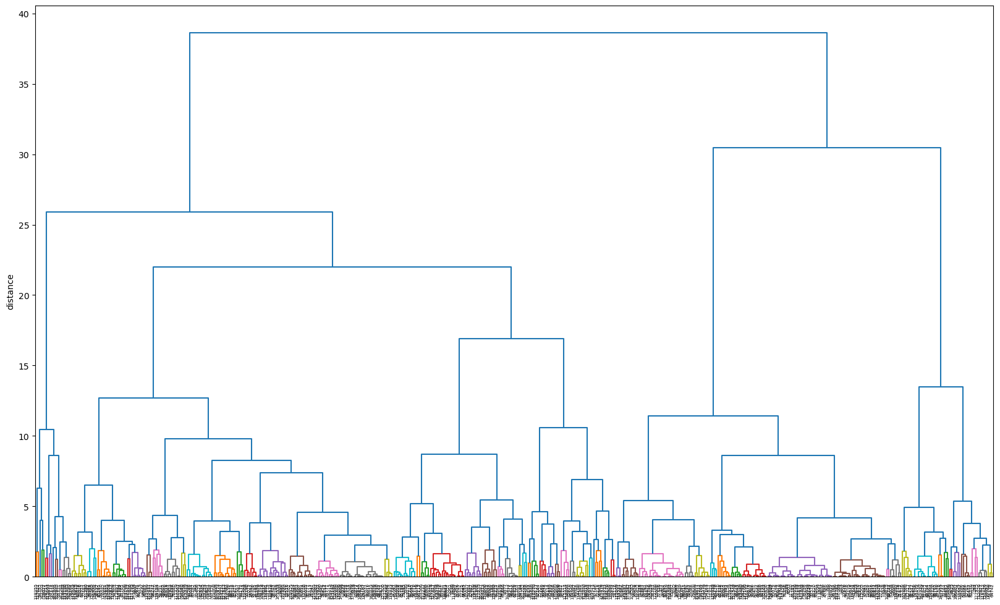

In [59]:
sample = X_sc.sample(500)
Z = hierarchy.linkage(sample, method='ward')

fig, ax = plt.subplots(figsize=(20, 12))
hierarchy.dendrogram(Z, labels=sample.index, ax=ax, color_threshold=2)
plt.xticks(rotation=90)
ax.set_ylabel('distance')
plt.show()

#### KMeans with K = 4

In [60]:
# max_k = 11
# silhouette_scores = silhouette_method(X_sc, max_k)

# # Plot silhouette scores
# plt.plot(range(2, max_k+1), silhouette_scores, marker='o')
# plt.title('Silhouette Score Method')
# plt.xlabel('Number of clusters')
# plt.ylabel('Silhouette Score')
# plt.show()

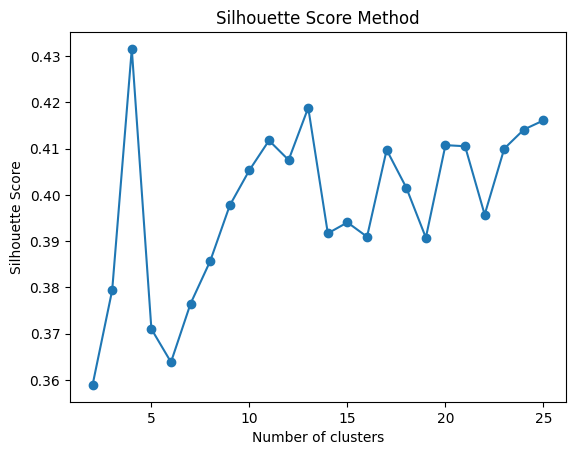

In [61]:
k = 4
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(X_sc)

clusters = pd.DataFrame(X_sc, columns=data.columns)
clusters['label'] = kmeans.labels_
clusters.head()

,ctc,yoe_in_current_organization,class,designation,tier,hike_in_current_org,label
0,-0.237834,-0.281792,-1.484520,-0.165589,-0.290948,0.348103,1
1,-0.590845,-0.758663,1.008114,1.204809,0.938877,0.348103,0
2,0.250950,-0.043357,-1.484520,-1.535986,-1.520774,0.348103,1
3,-0.455071,-0.520228,1.008114,1.204809,0.938877,0.348103,0
4,-0.074906,-0.520228,-1.484520,-0.165589,-1.520774,0.348103,1


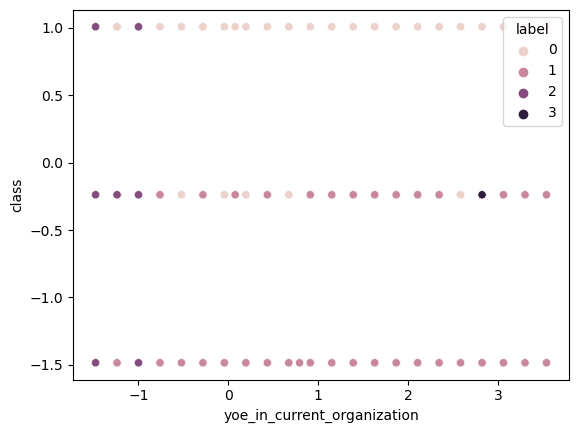

In [62]:
x_axis = 'yoe_in_current_organization'
y_axis = 'class'

sns.scatterplot(x = clusters[x_axis], y = clusters[y_axis], hue = clusters["label"])
# plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color="red", marker="X", s=100)
plt.xlabel(x_axis)
plt.ylabel(y_axis);

In [63]:
fig = px.scatter_3d(data, x='yoe_in_current_organization', y='ctc', z='tier', color=clusters['label'], width=800, height=800)
fig.show()

In [64]:
cluster_info = pd.DataFrame(kmeans.cluster_centers_, columns = data.columns)
cluster_info

,ctc,yoe_in_current_organization,class,designation,tier,hike_in_current_org
0,-0.405545,-0.129314,0.760457,0.619550,0.773380,0.348103
1,0.257129,0.396161,-0.832386,-0.655953,-0.849085,0.348103
2,-0.231048,-1.046402,0.199367,0.077858,0.232049,-2.872711
3,5.717421,0.287599,-1.376323,-1.138071,-1.511068,-0.103086


#### Elbow Method to find out perfect value for K

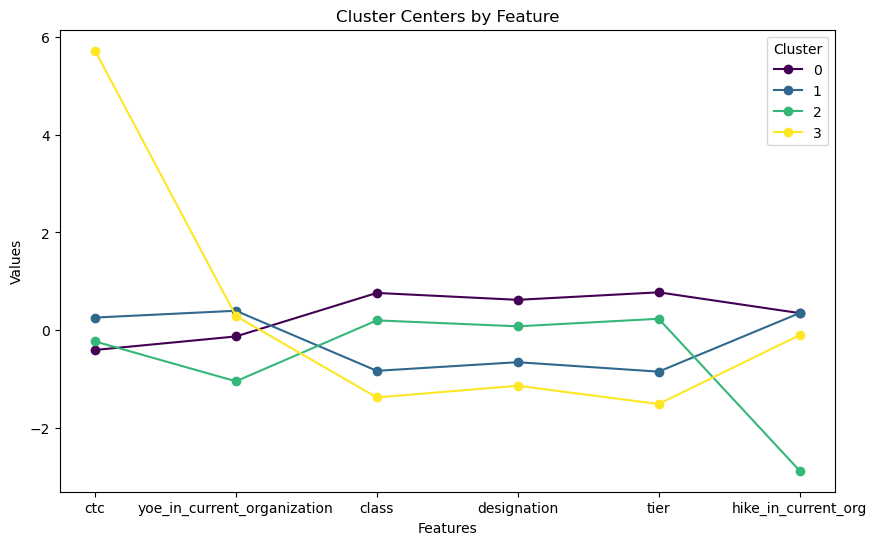

In [65]:
cluster_info = pd.DataFrame(kmeans.cluster_centers_, columns=data.columns)
cluster_info_transposed = cluster_info.transpose()

cluster_info_transposed.plot(kind="line", marker='o', figsize=(10, 6), cmap='viridis')
plt.xlabel('Features')
plt.ylabel('Values')
plt.title('Cluster Centers by Feature')
plt.legend(title='Cluster')
plt.show()


In [66]:
data["label"] = clusters["label"]

In [67]:
z = data.groupby(by = ["label"])[['ctc', 'yoe_in_current_organization', 'class', 'designation', 'tier','hike_in_current_org']].apply("mean").T

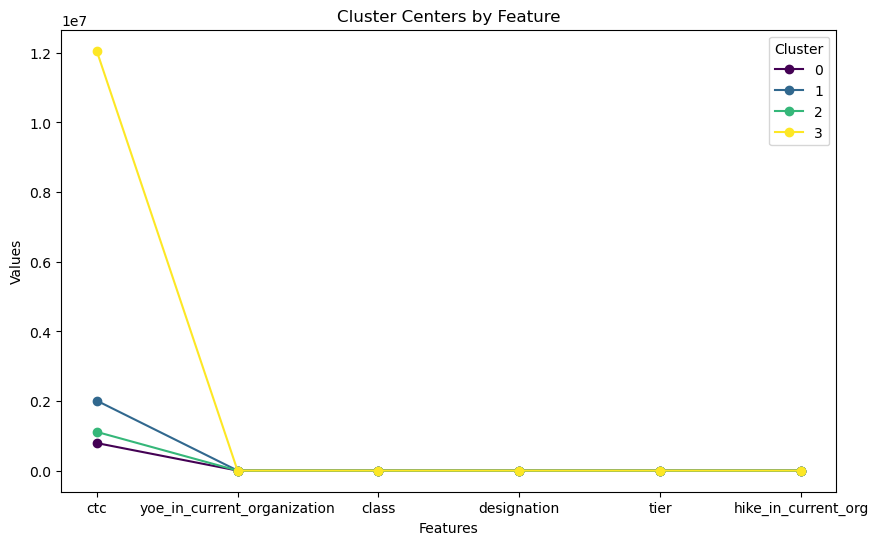

In [68]:
z.plot(kind="line", marker='o', figsize=(10, 6), cmap='viridis')
plt.xlabel('Features')
plt.ylabel('Values')
plt.title('Cluster Centers by Feature')
plt.legend(title='Cluster')
plt.show()

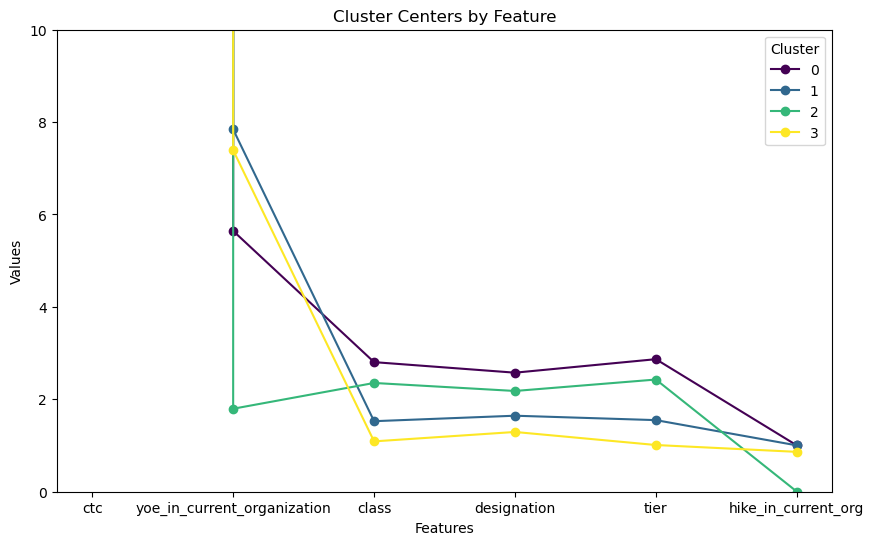

In [69]:
z.plot(kind="line", marker='o', figsize=(10, 6), cmap='viridis')
plt.xlabel('Features')
plt.ylabel('Values')
plt.title('Cluster Centers by Feature')
plt.legend(title='Cluster')
plt.ylim(0, 10)
plt.show()